In [1]:
from tools.project import INPUT_PATH, LOGS_PATH, OUTPUT_PATH, MODELS_PATH, RAW_PATH
import torch
import os
from datasets import Audio, load_dataset, Dataset
from src.jamendo_utils import read_file
from audiocraft.utils.notebook import display_audio
import numpy as np
import pandas as pd
from transformers import ClapConfig, ClapModel, AutoFeatureExtractor
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import default_collate
import tqdm

import umap
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
DEVICE = 'cpu'

In [2]:
model = ClapModel.from_pretrained("laion/clap-htsat-unfused").to(DEVICE)
feature_extractor = AutoFeatureExtractor.from_pretrained("laion/clap-htsat-unfused")

/home/mszawerda/.cache/pypoetry/virtualenvs/musicgen-ufgTm-Qc-py3.10/lib/python3.10/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


In [3]:
base_dir = RAW_PATH('song_describer', 'audio')

def map_path(ex):
    ex['audio'] = os.path.join(base_dir, ex['path'].replace('.mp3', '.2min.mp3'))
    return ex
def show_audio(ds, sec=10):
    for song in ds['audio']:
        display_audio(torch.Tensor(np.array(song['array']))[:song['sampling_rate']*sec][None], song['sampling_rate'])

ds=load_dataset('csv', data_files=[
                RAW_PATH('song_describer', 'song_describer.csv'),
                ], split='train').map(map_path)
ds = Dataset.from_pandas(ds.to_pandas().drop_duplicates(['track_id']))
tracks, tags, extra = read_file(RAW_PATH('song_describer', 'song_describer_14_04_23.mtg-jamendo.tsv'))
pop_artists = pd.Series([x['artist_id'] for k, x in tracks.items()]).value_counts().nlargest(5).index.tolist()
pop_artists

Reading: 705 tracks, 359 albums, 191 artists


[7063, 7805, 343767, 338649, 432273]

In [4]:
sr=44100
pop_artis = pop_artists[1]
theme_filter = lambda x: x['track_id'] in tags['mood/theme']['relaxing']
pop_filter = lambda x: x['artist_id'] == pop_artis
ds_filtered = ds.cast_column('audio', Audio(sampling_rate=48000))
show_audio(ds_filtered.take(3))

In [5]:
embeds = []
ids = []
with torch.no_grad():
    for row in tqdm.tqdm(ds_filtered):
        audio = row['audio']
        inputs = feature_extractor(torch.tensor(audio['array']), return_tensors="pt", sampling_rate=audio['sampling_rate'])
        ids.append(row['track_id'])
        embeds.append(model.get_audio_features(**inputs, ))
    
dim_input = torch.stack(embeds).squeeze().cpu().numpy()
reducer = umap.UMAP(n_neighbors=5, n_components=2, metric='cosine')
# reducer = PCA(n_components=2)

embeddings_2d = reducer.fit_transform(dim_input)

100%|██████████| 706/706 [05:06<00:00,  2.30it/s]
/home/mszawerda/.cache/pypoetry/virtualenvs/musicgen-ufgTm-Qc-py3.10/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


Map:   0%|          | 0/706 [00:00<?, ? examples/s]

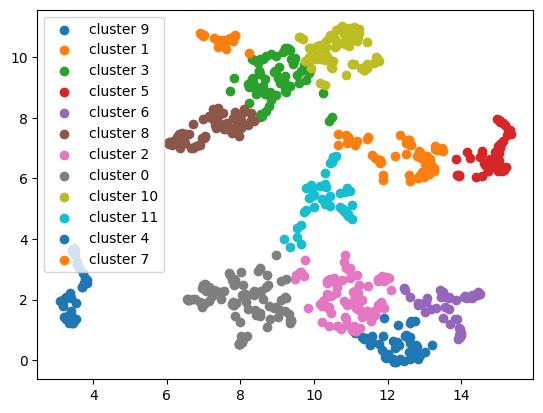

In [9]:
n_clusters = 12
clst = KMeans(n_clusters=n_clusters, random_state=0)
# clst = DBSCAN(eps=0.06, min_samples=5)

labels = clst.fit_predict(embeddings_2d)
clusters = {}
rev_lab = {}
for idx, label in enumerate(labels):
    rev_lab[ids[idx]] = idx
    if label not in clusters:
        clusters[label] = set()
    clusters[label].add(ids[idx])
ds_filtered=ds_filtered.map(lambda x, idx: {'clst': labels[idx]}, with_indices=True)

for i, idxs in clusters.items():
    a_id = [rev_lab[x] for x in idxs]
    plt.scatter(embeddings_2d[a_id, 0], embeddings_2d[a_id, 1], label=f'cluster {i}')
plt.legend()

In [11]:
ds_filtered.remove_columns(['audio']).to_json(RAW_PATH('song_describer', 'clap_clustered.json'))

Creating json from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

221328

In [163]:
cl_ids = clusters[3]
id_filter = lambda x: x['track_id'] in cl_ids

show_audio(ds_filtered.filter(id_filter, num_proc=8).take(5))

Filter (num_proc=20):   0%|          | 0/500 [00:00<?, ? examples/s]